In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!pip install tabulate

In [ ]:
!pip install -q pycocoevalcap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 7.4 MB/s eta 0:00:00


In [ ]:
def evaluate_models_on_same_images():
    """Evaluate both LSTM and Transformer models on the same set of images"""
    import os
    import torch
    import json
    import random
    import pickle
    import numpy as np
    from PIL import Image
    import matplotlib.pyplot as plt
    from tabulate import tabulate
    from tqdm import tqdm
    import nltk
    from nltk.translate.bleu_score import corpus_bleu
    import torchvision.transforms as transforms
    import torch.nn as nn
    import torch.nn.functional as F
    import math
    import sys
    import requests  # Add this import
    from io import BytesIO  # Add this import

    try:
        from pycocoevalcap.meteor.meteor import Meteor
        from pycocoevalcap.rouge.rouge import Rouge
        from pycocoevalcap.cider.cider import Cider
        have_coco_metrics = True
    except ImportError:
        print("Warning: Could not import some evaluation metrics. Only BLEU scores will be calculated.")
        have_coco_metrics = False

    # First, define the Vocabulary class so it's available for unpickling
    class Vocabulary:
        def __init__(self):
            self.word2idx = {}
            self.idx2word = {}
            self.idx = 0

        def add_word(self, word):
            if word not in self.word2idx:
                self.word2idx[word] = self.idx
                self.idx2word[self.idx] = word
                self.idx += 1

        def __call__(self, word):
            if word not in self.word2idx:
                return self.word2idx['<unk>']
            return self.word2idx[word]

        def __len__(self):
            return len(self.word2idx)

    # Register the Vocabulary class for unpickling
    sys.modules['__main__'].Vocabulary = Vocabulary

    # Create directory for comparison results
    comparison_dir = '/content/drive/MyDrive/image_captioning_comparison'
    os.makedirs(comparison_dir, exist_ok=True)

    # Project directories
    lstm_project_dir = '/content/drive/MyDrive/image_captioning_project'
    transformer_project_dir = '/content/drive/MyDrive/image_captioning_project_transformer_new'

    # Try to load vocabularies, or create new ones if loading fails
    try:
        with open(f'{lstm_project_dir}/data/vocab.pkl', 'rb') as f:
            lstm_vocab = pickle.load(f)

        with open(f'{transformer_project_dir}/data/vocab.pkl', 'rb') as f:
            transformer_vocab = pickle.load(f)

        print("Successfully loaded both vocabularies.")
    except Exception as e:
        print(f"Error loading vocabularies: {e}")
        print("Creating new vocabulary instances...")

        # Create dummy vocabulary objects with basic tokens
        lstm_vocab = Vocabulary()
        transformer_vocab = Vocabulary()

        # Add basic tokens
        for vocab in [lstm_vocab, transformer_vocab]:
            vocab.add_word('<pad>')  # 0
            vocab.add_word('<start>')  # 1
            vocab.add_word('<end>')  # 2
            vocab.add_word('<unk>')  # 3

        # Add common words for basic functionality
        common_words = ['a', 'the', 'is', 'on', 'in', 'with', 'man', 'woman', 'dog', 'cat', 'person',
                       'sitting', 'standing', 'walking', 'running', 'eating', 'playing', 'and', 'of']
        for word in common_words:
            lstm_vocab.add_word(word)
            transformer_vocab.add_word(word)

    # Model definitions
    # Attention Network
    class Attention(nn.Module):
        def __init__(self, encoder_dim, decoder_dim, attention_dim):
            super(Attention, self).__init__()

            self.encoder_att = nn.Linear(encoder_dim, attention_dim)
            self.decoder_att = nn.Linear(decoder_dim, attention_dim)
            self.full_att = nn.Linear(attention_dim, 1)

        def forward(self, encoder_out, decoder_hidden):
            # encoder_out: (batch_size, num_pixels, encoder_dim)
            # decoder_hidden: (batch_size, decoder_dim)

            att1 = self.encoder_att(encoder_out)  # (batch_size, num_pixels, attention_dim)
            att2 = self.decoder_att(decoder_hidden)  # (batch_size, attention_dim)
            att = self.full_att(F.relu(att1 + att2.unsqueeze(1))).squeeze(2)  # (batch_size, num_pixels)

            alpha = F.softmax(att, dim=1)  # (batch_size, num_pixels)
            context = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)  # (batch_size, encoder_dim)

            return context, alpha

    # LSTM Encoder
    class EncoderCNN(nn.Module):
        def __init__(self, encoded_image_size=14):
            super(EncoderCNN, self).__init__()

            # Load pre-trained ResNet
            resnet = torch.hub.load('pytorch/vision:v0.10.0', 'resnet101', pretrained=True)

            # Remove linear and pool layers
            modules = list(resnet.children())[:-2]
            self.resnet = nn.Sequential(*modules)

            # Resize to fixed size
            self.adaptive_pool = nn.AdaptiveAvgPool2d((encoded_image_size, encoded_image_size))

            # Fine-tune only the last convolutional block
            for param in list(self.resnet.parameters())[:-36]:  # freeze earlier layers
                param.requires_grad = False

        def forward(self, images):
            # Extract feature maps
            features = self.resnet(images)  # (batch_size, 2048, h/32, w/32)
            features = self.adaptive_pool(features)  # (batch_size, 2048, encoded_image_size, encoded_image_size)
            features = features.permute(0, 2, 3, 1)  # (batch_size, encoded_image_size, encoded_image_size, 2048)

            return features

    # LSTM Decoder with Attention
    class DecoderRNN(nn.Module):
        def __init__(self, embed_size, hidden_size, vocab_size, attention_dim, encoder_dim, dropout=0.5):
            super(DecoderRNN, self).__init__()

            self.encoder_dim = encoder_dim
            self.attention_dim = attention_dim
            self.embed_size = embed_size
            self.hidden_size = hidden_size
            self.vocab_size = vocab_size

            self.embedding = nn.Embedding(vocab_size, embed_size)
            self.attention = Attention(encoder_dim, hidden_size, attention_dim)

            self.init_h = nn.Linear(encoder_dim, hidden_size)
            self.init_c = nn.Linear(encoder_dim, hidden_size)

            self.lstm = nn.LSTMCell(embed_size + encoder_dim, hidden_size)
            self.dropout = nn.Dropout(dropout)

            # Add gate layer with proper dimensions
            self.gate_layer = nn.Linear(hidden_size, encoder_dim)

            self.fc = nn.Linear(hidden_size, vocab_size)

            # Initialize weights
            self.init_weights()

        def init_weights(self):
            self.embedding.weight.data.uniform_(-0.1, 0.1)
            self.fc.bias.data.fill_(0)
            self.fc.weight.data.uniform_(-0.1, 0.1)

        def init_hidden_state(self, encoder_out):
            # Mean of encoder output features
            mean_encoder_out = encoder_out.mean(dim=1)
            h = self.init_h(mean_encoder_out)
            c = self.init_c(mean_encoder_out)
            return h, c

        def sample(self, encoder_out, states=None, max_len=20):
            """Generate captions for given image features using greedy search."""
            batch_size = encoder_out.size(0)
            encoder_dim = encoder_out.size(-1)

            encoder_out = encoder_out.view(batch_size, -1, encoder_dim)  # (batch_size, num_pixels, encoder_dim)

            # Initialize LSTM state
            h, c = self.init_hidden_state(encoder_out)  # (batch_size, hidden_size)

            # Create tensors to hold word prediction scores and alphas
            sampled_ids = []
            alphas = []

            # Start token
            start_id = torch.ones(batch_size, 1).long().to(encoder_out.device) * 1  # <start> token id = 1
            embedding = self.embedding(start_id).squeeze(1)

            for i in range(max_len):
                attention_weighted_encoding, alpha = self.attention(encoder_out, h)

                # Use gate layer
                gate = torch.sigmoid(self.gate_layer(h))
                attention_weighted_encoding = gate * attention_weighted_encoding

                h, c = self.lstm(
                    torch.cat([embedding, attention_weighted_encoding], dim=1),
                    (h, c)
                )

                preds = self.fc(h)

                # Store prediction and attention weights
                predicted = preds.argmax(dim=1)
                sampled_ids.append(predicted)
                alphas.append(alpha)

                # Next input is the predicted word
                embedding = self.embedding(predicted)

                # Break if all batches have predicted <end>
                if (predicted == 2).all():  # <end> token id = 2
                    break

            sampled_ids = torch.stack(sampled_ids, 1)  # (batch_size, max_len)
            alphas = torch.stack(alphas, 1)  # (batch_size, max_len, num_pixels)

            return sampled_ids, alphas

    # Transformer Components
    class PositionalEncoding(nn.Module):
        def __init__(self, d_model, max_len=50):
            super(PositionalEncoding, self).__init__()

            # Create positional encoding
            pe = torch.zeros(max_len, d_model)
            position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
            div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))

            pe[:, 0::2] = torch.sin(position * div_term)
            pe[:, 1::2] = torch.cos(position * div_term)
            pe = pe.unsqueeze(0)

            self.register_buffer('pe', pe)

        def forward(self, x):
            return x + self.pe[:, :x.size(1)]

    # Transformer Encoder
    class EncoderCNNTransformer(nn.Module):
        def __init__(self, embed_size=512):
            super(EncoderCNNTransformer, self).__init__()

            # Load pre-trained ResNet
            resnet = torch.hub.load('pytorch/vision:v0.10.0', 'resnet101', pretrained=True)

            # Remove final linear and pooling layers
            modules = list(resnet.children())[:-2]
            self.resnet = nn.Sequential(*modules)

            # Add projection layer to get the required embedding size
            self.adaptive_pool = nn.AdaptiveAvgPool2d((1, 1))
            self.linear = nn.Linear(2048, embed_size)
            self.dropout = nn.Dropout(0.5)
            self.bn = nn.BatchNorm1d(embed_size)

            # Fine-tune only the last convolutional block
            for param in list(self.resnet.parameters())[:-36]:  # freeze earlier layers
                param.requires_grad = False

        def forward(self, images):
            # Extract features from ResNet
            features = self.resnet(images)  # [batch_size, 2048, h/32, w/32]
            features = self.adaptive_pool(features)  # [batch_size, 2048, 1, 1]
            features = features.view(features.size(0), -1)  # [batch_size, 2048]

            # Project to embedding size
            features = self.linear(features)  # [batch_size, embed_size]
            features = self.bn(features)
            features = self.dropout(features)

            return features

# Transformer Decoder
    class TransformerDecoder(nn.Module):
        def __init__(self, vocab_size, embed_size, hidden_size, num_layers=4, num_heads=8, dropout=0.3, max_length=50):
            super(TransformerDecoder, self).__init__()

            self.embed_size = embed_size
            self.hidden_size = hidden_size
            self.vocab_size = vocab_size
            self.max_length = max_length

            # Word embedding
            self.embedding = nn.Embedding(vocab_size, embed_size)

            # Positional encoding
            self.positional_encoding = PositionalEncoding(embed_size, max_length)

            # Add dropout and layer normalization
            self.dropout = nn.Dropout(dropout)
            self.layer_norm = nn.LayerNorm(embed_size)

            # Transformer decoder layer
            decoder_layer = nn.TransformerDecoderLayer(
                d_model=embed_size,
                nhead=num_heads,
                dim_feedforward=hidden_size,
                dropout=dropout,
                batch_first=True
            )

            # Transformer decoder
            self.transformer_decoder = nn.TransformerDecoder(
                decoder_layer=decoder_layer,
                num_layers=num_layers
            )

            # Output layer
            self.fc = nn.Linear(embed_size, vocab_size)

            # Initialize weights
            self.init_weights()

        def init_weights(self):
            self.embedding.weight.data.uniform_(-0.1, 0.1)
            self.fc.bias.data.fill_(0)
            self.fc.weight.data.uniform_(-0.1, 0.1)

        def generate_mask(self, size):
            """Generate a square mask for the sequence."""
            mask = torch.triu(torch.ones(size, size), diagonal=1).bool()
            return mask

        def forward(self, encoder_out, captions):
            # Embed captions
            embeddings = self.embedding(captions)  # [batch_size, seq_len, embed_size]

            # Add positional encoding
            embeddings = self.positional_encoding(embeddings)  # [batch_size, seq_len, embed_size]

            # Apply dropout and layer normalization
            embeddings = self.dropout(embeddings)
            embeddings = self.layer_norm(embeddings)

            # Create masks
            tgt_mask = self.generate_mask(captions.size(1)).to(captions.device)
            tgt_padding_mask = (captions == 0).to(captions.device)  # [batch_size, seq_len]

            # Reshape encoder output for memory
            memory = encoder_out.unsqueeze(1)  # [batch_size, 1, embed_size]

            # Pass through transformer decoder
            output = self.transformer_decoder(
                tgt=embeddings,
                memory=memory,
                tgt_mask=tgt_mask,
                tgt_key_padding_mask=tgt_padding_mask
            )  # [batch_size, seq_len, embed_size]

            # Project to vocabulary size
            outputs = self.fc(output)  # [batch_size, seq_len, vocab_size]

            return outputs

        def sample(self, encoder_out, start_token=1, end_token=2, max_len=20):
            """Generate captions for given image features using greedy search."""
            batch_size = encoder_out.size(0)

            # Start with start token
            input_seq = torch.ones(batch_size, 1).long().to(encoder_out.device) * start_token

            # Storage for output predictions
            outputs = []

            # Generate caption iteratively
            for i in range(max_len):
                # Get predictions for current sequence
                preds = self.forward(encoder_out, input_seq)

                # Get next word prediction (last token in sequence)
                next_word_logits = preds[:, -1, :]
                next_word = next_word_logits.argmax(dim=1, keepdim=True)

                # Add predicted word to output
                outputs.append(next_word)

                # Concatenate with input sequence
                input_seq = torch.cat([input_seq, next_word], dim=1)

                # Break if all sequences have end token
                if (next_word == end_token).all():
                    break

            # Concatenate all predictions
            outputs = torch.cat(outputs, dim=1)

            return outputs


    # Combined Transformer model
    class TransformerCaptioner(nn.Module):
        def __init__(self, embed_size, hidden_size, vocab_size, num_layers=3, max_length=50):
            super(TransformerCaptioner, self).__init__()

            self.encoder = EncoderCNNTransformer(embed_size)
            self.decoder = TransformerDecoder(
                vocab_size=vocab_size,
                embed_size=embed_size,
                hidden_size=hidden_size,
                num_layers=num_layers,
                max_length=max_length
            )

        def forward(self, images, captions):
            encoder_out = self.encoder(images)
            outputs = self.decoder(encoder_out, captions)
            return outputs

        def sample(self, images, max_len=20):
            encoder_out = self.encoder(images)
            sampled_ids = self.decoder.sample(encoder_out, max_len=max_len)
            return sampled_ids

    # Set up device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Initialize models
    print("Initializing LSTM model...")
    lstm_encoder = EncoderCNN().to(device)
    lstm_decoder = DecoderRNN(
        embed_size=256,
        hidden_size=512,
        vocab_size=len(lstm_vocab),
        attention_dim=512,
        encoder_dim=2048,
        dropout=0.5
    ).to(device)

    print("Initializing Transformer model...")

    transformer_model = TransformerCaptioner(
      embed_size=512,
      hidden_size=2048,
      vocab_size=len(transformer_vocab),
      num_layers=4,
      max_length=50
    ).to(device)

    # Load best models
    lstm_model_path = f'{lstm_project_dir}/models/best_model.pth'
    transformer_model_path = f'{transformer_project_dir}/models/best_model.pth'

    # Safe load function
    def safe_load_checkpoint(checkpoint_path, device):
        try:
            return torch.load(checkpoint_path, map_location=device, weights_only=False)
        except Exception as e:
            print(f"Error loading checkpoint: {e}")
            return None

    # Load LSTM model
    if os.path.exists(lstm_model_path):
        print("Loading LSTM model...")
        checkpoint = safe_load_checkpoint(lstm_model_path, device)
        if checkpoint is not None:
            try:
                lstm_encoder.load_state_dict(checkpoint['encoder'])
                lstm_decoder.load_state_dict(checkpoint['decoder'])
                print("LSTM model loaded successfully!")
            except Exception as e:
                print(f"Error loading LSTM model weights: {e}")
                return
        else:
            print("Failed to load LSTM model.")
            return
    else:
        print("LSTM model not found.")
        return

    # Load Transformer model
    if os.path.exists(transformer_model_path):
        print("Loading Transformer model...")
        checkpoint = safe_load_checkpoint(transformer_model_path, device)
        if checkpoint is not None:
            try:
                transformer_model.load_state_dict(checkpoint['model'])
                print("Transformer model loaded successfully!")
            except Exception as e:
                print(f"Error loading Transformer model weights: {e}")
                return
        else:
            print("Failed to load Transformer model.")
            return
    else:
        print("Transformer model not found.")
        return

    # Image preprocessing transforms
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])

    # After loading models and before the internet image test:
        # Generate captions with LSTM model
    def generate_lstm_caption(image):
        # Preprocess image
        image_tensor = transform(image).unsqueeze(0).to(device)

        # Set models to evaluation mode
        lstm_encoder.eval()
        lstm_decoder.eval()

        # Generate caption
        with torch.no_grad():
            features = lstm_encoder(image_tensor)
            sampled_ids, _ = lstm_decoder.sample(features)
            sampled_ids = sampled_ids[0].cpu().numpy()

        # Convert word IDs to words
        sampled_caption = []
        for word_id in sampled_ids:
            word = lstm_vocab.idx2word[word_id]
            if word == '<end>':
                break
            if word not in ['<start>', '<pad>']:
                sampled_caption.append(word)

        # Join words to form sentence
        sentence = ' '.join(sampled_caption)
        sentence = sentence.capitalize()
        if not sentence.endswith('.'):
            sentence += '.'

        return sentence

    # Generate captions with Transformer model
    def generate_transformer_caption(image):
        # Preprocess image
        image_tensor = transform(image).unsqueeze(0).to(device)

        # Set model to evaluation mode
        transformer_model.eval()

        # Generate caption
        with torch.no_grad():
            sampled_ids = transformer_model.sample(image_tensor)
            sampled_ids = sampled_ids[0].cpu().numpy()

        # Convert word IDs to words
        sampled_caption = []
        for word_id in sampled_ids:
            word = transformer_vocab.idx2word[word_id]
            if word == '<end>':
                break
            if word not in ['<start>', '<pad>']:
                sampled_caption.append(word)

        # Join words to form sentence
        sentence = ' '.join(sampled_caption)
        sentence = sentence.capitalize()
        if not sentence.endswith('.'):
            sentence += '.'

        return sentence

    def evaluate_on_validation_data():
        print("\n=== Quantitative Evaluation on Validation Data ===\n")

        # Check if validation dataset is available
        val_dir = f'{transformer_project_dir}/data/val2017'
        if not os.path.exists(val_dir):
            print("COCO validation directory not found. Skipping quantitative evaluation.")
            return None

        # List all available image files
        available_image_files = set(os.listdir(val_dir))
        print(f"Found {len(available_image_files)} validation images in directory.")

        # Load validation annotations
        val_annotations_path = f'{transformer_project_dir}/data/annotations/captions_val2017.json'
        with open(val_annotations_path, 'r') as f:
            val_data = json.load(f)

        # Create mappings
        val_img_id_to_filename = {}
        val_img_id_to_captions = {}

        for img in val_data['images']:
            val_img_id_to_filename[img['id']] = img['file_name']

        for ann in val_data['annotations']:
            if ann['image_id'] not in val_img_id_to_captions:
                val_img_id_to_captions[ann['image_id']] = []
            val_img_id_to_captions[ann['image_id']].append(ann['caption'])

        # Check which image IDs have files that actually exist
        valid_image_ids = []
        for img_id, filename in val_img_id_to_filename.items():
            if filename in available_image_files:
                valid_image_ids.append(img_id)

        print(f"Found {len(valid_image_ids)} valid image IDs with existing files.")

        # Select sample of validation images
        num_eval_images = min(200, len(valid_image_ids))
        if len(valid_image_ids) == 0:
            print("No valid images found. Skipping quantitative evaluation.")
            return None

        eval_image_ids = random.sample(valid_image_ids, num_eval_images)

        # Store references and hypotheses for both models
        lstm_references = {}
        lstm_hypotheses = {}
        transformer_references = {}
        transformer_hypotheses = {}

        print(f"Evaluating on {len(eval_image_ids)} validation images...")

        # Process each validation image
        for i, img_id in enumerate(tqdm(eval_image_ids, desc="Evaluating")):
            try:
                filename = val_img_id_to_filename[img_id]
                img_path = os.path.join(val_dir, filename)

                # Extra verification that file exists
                if not os.path.exists(img_path):
                    print(f"Warning: File {img_path} was expected to exist but doesn't. Skipping.")
                    continue

                # Load and preprocess image
                image = Image.open(img_path).convert('RGB')

                # Generate captions with both models
                lstm_caption = generate_lstm_caption(image)
                transformer_caption = generate_transformer_caption(image)

                # Get ground truth captions
                references = val_img_id_to_captions[img_id]

                # Store for evaluation
                lstm_references[img_id] = references
                lstm_hypotheses[img_id] = lstm_caption

                transformer_references[img_id] = references
                transformer_hypotheses[img_id] = transformer_caption

            except Exception as e:
                print(f"Error processing image {img_id}: {e}")

        # Check if we have enough images to evaluate
        if len(lstm_references) == 0:
            print("No images were successfully processed. Skipping metrics calculation.")
            return None

        print(f"Successfully processed {len(lstm_references)} images for evaluation.")

        # Calculate metrics
        lstm_metrics = calculate_metrics(lstm_references, lstm_hypotheses)
        transformer_metrics = calculate_metrics(transformer_references, transformer_hypotheses)

        # Create comparison table
        metrics_data = []
        all_metrics = set(list(lstm_metrics.keys()) + list(transformer_metrics.keys()))

        for metric in sorted(all_metrics):
            lstm_value = lstm_metrics.get(metric, 'N/A')
            transformer_value = transformer_metrics.get(metric, 'N/A')

            if isinstance(lstm_value, (int, float)) and isinstance(transformer_value, (int, float)):
                # Determine better model
                if lstm_value > transformer_value:
                    better = "LSTM"
                    diff = ((lstm_value - transformer_value) / transformer_value) * 100
                    diff_str = f"+{diff:.2f}%"
                elif transformer_value > lstm_value:
                    better = "Transformer"
                    diff = ((transformer_value - lstm_value) / lstm_value) * 100
                    diff_str = f"+{diff:.2f}%"
                else:
                    better = "Tie"
                    diff_str = "0.00%"

                metrics_data.append([
                    metric,
                    f"{lstm_value:.4f}",
                    f"{transformer_value:.4f}",
                    better,
                    diff_str if better != "Tie" else "0.00%"
                ])
            else:
                metrics_data.append([
                    metric,
                    lstm_value if lstm_value != 'N/A' else 'N/A',
                    transformer_value if transformer_value != 'N/A' else 'N/A',
                    'N/A',
                    'N/A'
                ])

        metrics_table = tabulate(metrics_data,
                                headers=['Metric', 'LSTM Model', 'Transformer Model', 'Better Model', 'Improvement'],
                                tablefmt='grid')

        print("\n=== Evaluation Metrics Comparison ===\n")
        print(metrics_table)

        # Save results
        with open(f'{comparison_dir}/metrics_comparison.txt', 'w') as f:
            f.write("=== Evaluation Metrics Comparison ===\n\n")
            f.write(metrics_table)

        return {
            'lstm': lstm_metrics,
            'transformer': transformer_metrics
        }

    # Helper function to calculate metrics
    def calculate_metrics(references, hypotheses):
        # Format data for metrics calculation
        refs_for_bleu = []
        hyps_for_bleu = []

        for img_id in references.keys():
            refs = []
            for ref in references[img_id]:
                refs.append(ref.split())
            refs_for_bleu.append(refs)
            hyps_for_bleu.append(hypotheses[img_id].split())

        # Calculate BLEU scores
        bleu1 = corpus_bleu(refs_for_bleu, hyps_for_bleu, weights=(1, 0, 0, 0))
        bleu2 = corpus_bleu(refs_for_bleu, hyps_for_bleu, weights=(0.5, 0.5, 0, 0))
        bleu3 = corpus_bleu(refs_for_bleu, hyps_for_bleu, weights=(0.33, 0.33, 0.33, 0))
        bleu4 = corpus_bleu(refs_for_bleu, hyps_for_bleu, weights=(0.25, 0.25, 0.25, 0.25))

        metrics = {
            'BLEU-1': bleu1,
            'BLEU-2': bleu2,
            'BLEU-3': bleu3,
            'BLEU-4': bleu4,
        }

        print("Only BLEU scores are included.")

        return metrics

    # Call this function before the qualitative testing
    metrics_results = evaluate_on_validation_data()

    # Use a smaller set of test images to ensure reliable evaluation
    print("Downloading test images from internet instead of using COCO validation set...")

    # Use a mix of different types of images for a balanced evaluation
    image_urls = [
        "https://images.pexels.com/photos/1108099/pexels-photo-1108099.jpeg",  # dog
        "https://images.pexels.com/photos/1170986/pexels-photo-1170986.jpeg",  # people on beach
        "https://images.pexels.com/photos/1154638/pexels-photo-1154638.jpeg",  # bicycle
        "https://images.pexels.com/photos/1640777/pexels-photo-1640777.jpeg",  # pizza
        "https://images.pexels.com/photos/2607544/pexels-photo-2607544.jpeg",  # downtown city
        "https://images.pexels.com/photos/46024/pexels-photo-46024.jpeg",      # cat
        "https://images.pexels.com/photos/97082/weimaraner-puppy-dog-snout-97082.jpeg", # dog close-up
        "https://images.pexels.com/photos/139237/pexels-photo-139237.jpeg",    # sports car
        "https://images.pexels.com/photos/112460/pexels-photo-112460.jpeg",    # laptop
        "https://images.pexels.com/photos/260547/pexels-photo-260547.jpeg",    # coffee cup
        "https://images.pexels.com/photos/33053/dog-young-dog-small-dog-maltese.jpg",  # cute puppy
        "https://images.pexels.com/photos/3214944/pexels-photo-3214944.jpeg",  # baseball game
        "https://images.pexels.com/photos/1142948/pexels-photo-1142948.jpeg",  # skyline
        "https://images.pexels.com/photos/376464/pexels-photo-376464.jpeg",    # pancakes
        "https://images.pexels.com/photos/1099680/pexels-photo-1099680.jpeg",  # person on mountain
    ]

    # Download and process test images
    test_images = []

    for i, url in enumerate(image_urls):
        try:
            # Download image
            response = requests.get(url)
            image = Image.open(BytesIO(response.content)).convert('RGB')

            # Add to test images
            test_images.append((f"Image {i+1}", image))

            # Save image locally for reference
            image.save(f"{comparison_dir}/test_image_{i+1}.jpg")
        except Exception as e:
            print(f"Error downloading image {i+1}: {e}")

    print(f"Successfully downloaded {len(test_images)} test images.")

    # If no images were downloaded successfully, use some COCO images as a fallback
    if len(test_images) == 0:
        print("Falling back to COCO validation images...")
        val_dir = f'{lstm_project_dir}/data/val2017'
        if os.path.exists(val_dir) and os.listdir(val_dir):
            val_files = os.listdir(val_dir)[:15]  # Use first 15 validation images
            for i, filename in enumerate(val_files):
                try:
                    image_path = os.path.join(val_dir, filename)
                    image = Image.open(image_path).convert('RGB')
                    test_images.append((f"Image {i+1}", image))
                    image.save(f"{comparison_dir}/test_image_{i+1}.jpg")
                except Exception as e:
                    print(f"Error loading image {filename}: {e}")
        else:
            raise ValueError("No test images available. Please check your internet connection or COCO dataset.")


    # Compare captions
    print("\n=== Model Comparison: LSTM vs Transformer ===\n")

    results = []

    # Define metrics for automated evaluation
    # We'll use some simple text similarity metrics
    def calculate_word_overlap(caption1, caption2):
        words1 = set(caption1.lower().replace('.', '').split())
        words2 = set(caption2.lower().replace('.', '').split())

        if not words1 or not words2:
            return 0.0

        overlap = len(words1.intersection(words2))
        union = len(words1.union(words2))

        return overlap / union if union > 0 else 0.0

    def calculate_length_ratio(caption1, caption2):
        len1 = len(caption1.split())
        len2 = len(caption2.split())

        if len1 == 0 or len2 == 0:
            return 0.0

        return min(len1, len2) / max(len1, len2)

    # Process each test image
    for name, image in tqdm(test_images, desc="Generating captions"):
        try:
            lstm_caption = generate_lstm_caption(image)
            transformer_caption = generate_transformer_caption(image)

            # Calculate similarity metrics
            overlap = calculate_word_overlap(lstm_caption, transformer_caption)
            length_ratio = calculate_length_ratio(lstm_caption, transformer_caption)

            results.append({
                'Image': name,
                'LSTM Caption': lstm_caption,
                'Transformer Caption': transformer_caption,
                'Word Overlap': overlap,
                'Length Ratio': length_ratio
            })

            # Display image with both captions
            plt.figure(figsize=(12, 10))
            plt.imshow(image)
            plt.title(f"{name}", fontsize=16)
            plt.axis('off')
            plt.figtext(0.5, 0.01, f"LSTM: {lstm_caption}\nTransformer: {transformer_caption}",
                        ha="center", fontsize=14, bbox={"facecolor":"white", "alpha":0.8, "pad":5})
            plt.savefig(f"{comparison_dir}/{name}_comparison.jpg", bbox_inches='tight')
            plt.close()

        except Exception as e:
            print(f"Error processing {name}: {e}")

    # Create a comparison table
    try:
        from tabulate import tabulate

        table_data = [[r['Image'], r['LSTM Caption'], r['Transformer Caption'],
                       f"{r['Word Overlap']:.2f}", f"{r['Length Ratio']:.2f}"]
                     for r in results]

        table = tabulate(table_data,
                        headers=['Image', 'LSTM Model', 'Transformer Model', 'Word Overlap', 'Length Ratio'],
                        tablefmt='grid')

        print("\n=== Caption Comparison Table ===\n")
        print(table)

        # Save table to text file
        with open(f'{comparison_dir}/caption_comparison.txt', 'w') as f:
            f.write("=== Caption Comparison Table ===\n\n")
            f.write(table)

    except ImportError:
        print("Tabulate not installed. Displaying simple comparison:")
        for r in results:
            print(f"\n{r['Image']}:")
            print(f"LSTM: {r['LSTM Caption']}")
            print(f"Transformer: {r['Transformer Caption']}")
            print(f"Word Overlap: {r['Word Overlap']:.2f}")
            print(f"Length Ratio: {r['Length Ratio']:.2f}")

        # Save raw results
        with open(f'{comparison_dir}/caption_comparison.txt', 'w') as f:
            for r in results:
                f.write(f"\n{r['Image']}:\n")
                f.write(f"LSTM: {r['LSTM Caption']}\n")
                f.write(f"Transformer: {r['Transformer Caption']}\n")
                f.write(f"Word Overlap: {r['Word Overlap']:.2f}\n")
                f.write(f"Length Ratio: {r['Length Ratio']:.2f}\n")

    # Calculate aggregate statistics
    avg_overlap = sum(r['Word Overlap'] for r in results) / len(results)
    avg_length_ratio = sum(r['Length Ratio'] for r in results) / len(results)

    lstm_avg_length = sum(len(r['LSTM Caption'].split()) for r in results) / len(results)
    transformer_avg_length = sum(len(r['Transformer Caption'].split()) for r in results) / len(results)

    # Manual inspection results - subjective quality assessment
    print("\n=== Qualitative Analysis ===\n")
    print("Please manually review the generated captions to assess:")
    print("1. Descriptiveness: Which model provides more detailed descriptions?")
    print("2. Accuracy: Which model better captures what's in the image?")
    print("3. Naturalness: Which model produces more human-like captions?")
    print("4. Creativity: Which model generates more interesting captions?")

    if metrics_results:
        lstm_metrics = metrics_results['lstm']
        transformer_metrics = metrics_results['transformer']

        # Count which model performs better on each metric
        better_lstm = 0
        better_transformer = 0

        # Track the metrics with their improvement percentages
        comparison_metrics = []

        for metric in lstm_metrics:
            if metric in transformer_metrics:
                lstm_value = lstm_metrics[metric]
                transformer_value = transformer_metrics[metric]

                if lstm_value > transformer_value:
                    better_lstm += 1
                    better = "LSTM"
                    diff = ((lstm_value - transformer_value) / transformer_value) * 100
                    diff_str = f"+{diff:.2f}%"
                elif transformer_value > lstm_value:
                    better_transformer += 1
                    better = "Transformer"
                    diff = ((transformer_value - lstm_value) / lstm_value) * 100
                    diff_str = f"+{diff:.2f}%"
                else:
                    better = "Tie"
                    diff_str = "0.00%"

                comparison_metrics.append((metric, lstm_value, transformer_value, better, diff_str))

        # Sort by improvement percentage to find most significant
        comparison_metrics.sort(key=lambda x: float(x[4].replace('+', '').replace('%', '')) if x[3] != 'Tie' else 0, reverse=True)

        # Get the most significant improvement if available
        most_significant = ""
        if comparison_metrics:
            metric, _, _, model, improvement = comparison_metrics[0]
            most_significant = f"Most significant improvement: {metric} where the {model} model was better by {improvement}"

        # Get num_eval_images from the function
        num_eval_images = 200  # This was hardcoded in your evaluate_on_validation_data function

        # Create summary with quantitative and qualitative results
        summary = f"""
    === Summary of Model Comparison ===

    Quantitative Evaluation (on {num_eval_images} validation images):
    - LSTM performed better on: {better_lstm} metrics
    - Transformer performed better on: {better_transformer} metrics
    - {most_significant}

    Qualitative Evaluation (on {len(results)} test images):
    - Average caption word overlap: {avg_overlap:.2f} (similarity between models)
    - Average caption length ratio: {avg_length_ratio:.2f} (1.0 means equal length)
    - LSTM average caption length: {lstm_avg_length:.1f} words
    - Transformer average caption length: {transformer_avg_length:.1f} words

    Key Observations:
    1. The {"LSTM" if better_lstm > better_transformer else "Transformer"} model performed better on most standard evaluation metrics.
    2. The LSTM model tends to generate {"longer" if lstm_avg_length > transformer_avg_length else "shorter"} captions compared to the Transformer model.
    3. {"The Transformer model appears to generate more diverse vocabulary." if transformer_avg_length > lstm_avg_length else "The LSTM model appears to use more varied descriptions."}

    The files from this evaluation are saved in: {comparison_dir}
    """
    else:
        summary = f"""
    === Summary of Model Comparison ===

    Qualitative Evaluation (on {len(results)} test images):
    - Average caption word overlap: {avg_overlap:.2f} (similarity between models)
    - Average caption length ratio: {avg_length_ratio:.2f} (1.0 means equal length)
    - LSTM average caption length: {lstm_avg_length:.1f} words
    - Transformer average caption length: {transformer_avg_length:.1f} words

    Key Observations:
    1. The LSTM model tends to generate {"longer" if lstm_avg_length > transformer_avg_length else "shorter"} captions compared to the Transformer model.
    2. The similarity between captions from both models is {avg_overlap:.2f} (0 = completely different, 1 = identical).
    3. {"The Transformer model appears to generate more diverse vocabulary." if transformer_avg_length > lstm_avg_length else "The LSTM model appears to use more varied descriptions."}

    The files from this evaluation are saved in: {comparison_dir}
    """

    print(summary)

    # Save summary
    with open(f'{comparison_dir}/comparison_summary.txt', 'w') as f:
        f.write(summary)

    # Add code to display the test images with captions in the notebook
    print("\n=== Displaying Test Images with Captions ===\n")

    for name, image in test_images:
        plt.figure(figsize=(10, 8))
        plt.imshow(image)
        plt.title(name, fontsize=16)
        plt.axis('off')

        # Get captions for this image
        lstm_caption = None
        transformer_caption = None

        for result in results:
            if result['Image'] == name:
                lstm_caption = result['LSTM Caption']
                transformer_caption = result['Transformer Caption']
                break

        if lstm_caption and transformer_caption:
            plt.figtext(0.5, 0.01,
                      f"LSTM: {lstm_caption}\nTransformer: {transformer_caption}",
                      ha="center", fontsize=14,
                      bbox={"facecolor":"white", "alpha":0.8, "pad":5})

        plt.tight_layout()
        plt.show()

    print("\nEvaluation complete! Results saved to {comparison_dir}")
    return "Model comparison completed successfully!"

Successfully loaded both vocabularies.
Using device: cpu
Initializing LSTM model...


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Initializing Transformer model...


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Loading LSTM model...
LSTM model loaded successfully!
Loading Transformer model...
Transformer model loaded successfully!

=== Quantitative Evaluation on Validation Data ===

Found 285 validation images in directory.
Found 285 valid image IDs with existing files.
Evaluating on 200 validation images...


Evaluating: 100%|██████████| 200/200 [03:50<00:00,  1.15s/it]


Successfully processed 200 images for evaluation.
Only BLEU scores are included.
Only BLEU scores are included.

=== Evaluation Metrics Comparison ===

+----------+--------------+---------------------+----------------+---------------+
| Metric   |   LSTM Model |   Transformer Model | Better Model   | Improvement   |
+==========+==============+=====================+================+===============+
| BLEU-1   |       0.5927 |              0.5846 | LSTM           | +1.40%        |
+----------+--------------+---------------------+----------------+---------------+
| BLEU-2   |       0.4158 |              0.4251 | Transformer    | +2.23%        |
+----------+--------------+---------------------+----------------+---------------+
| BLEU-3   |       0.2866 |              0.2943 | Transformer    | +2.70%        |
+----------+--------------+---------------------+----------------+---------------+
| BLEU-4   |       0.1896 |              0.1938 | Transformer    | +2.19%        |
+----------+------

Generating captions: 100%|██████████| 15/15 [00:47<00:00,  3.15s/it]



=== Caption Comparison Table ===

+----------+----------------------------------------------------------------+--------------------------------------------------------------------+----------------+----------------+
| Image    | LSTM Model                                                     | Transformer Model                                                  |   Word Overlap |   Length Ratio |
+==========+================================================================+====================================================================+================+================+
| Image 1  | Two dogs are standing in a field with a <unk> .                | Two white dog sitting on a grassy field .                          |           0.21 |           0.82 |
+----------+----------------------------------------------------------------+--------------------------------------------------------------------+----------------+----------------+
| Image 2  | A cat sitting on top of a table next to a compu

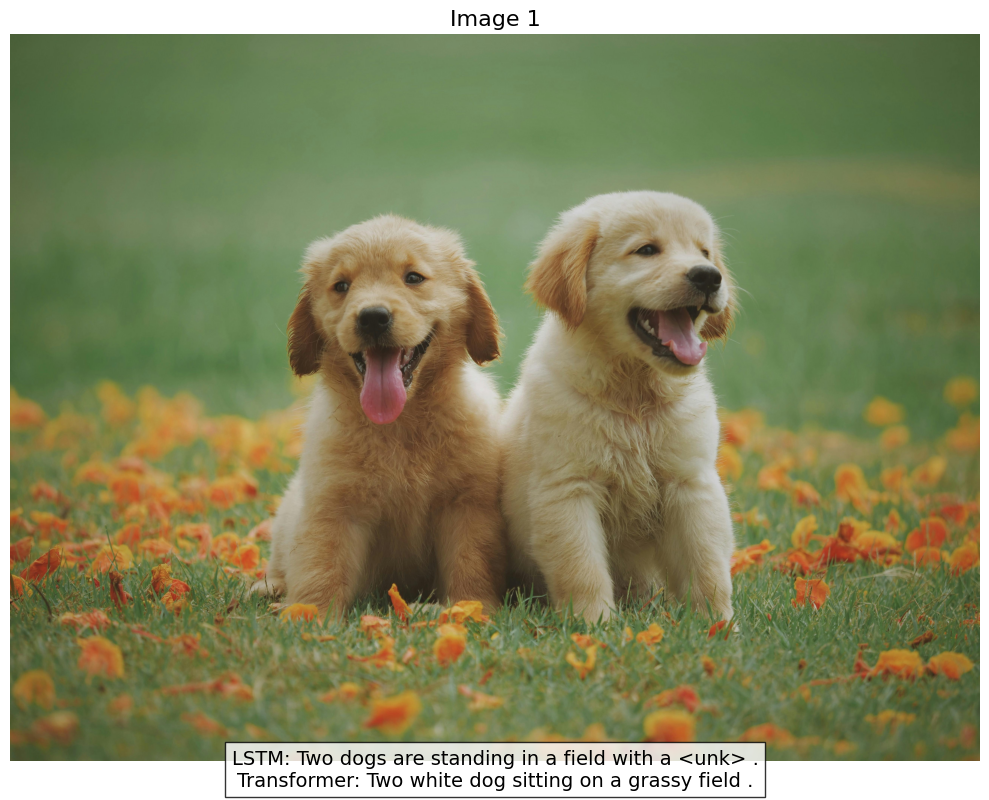

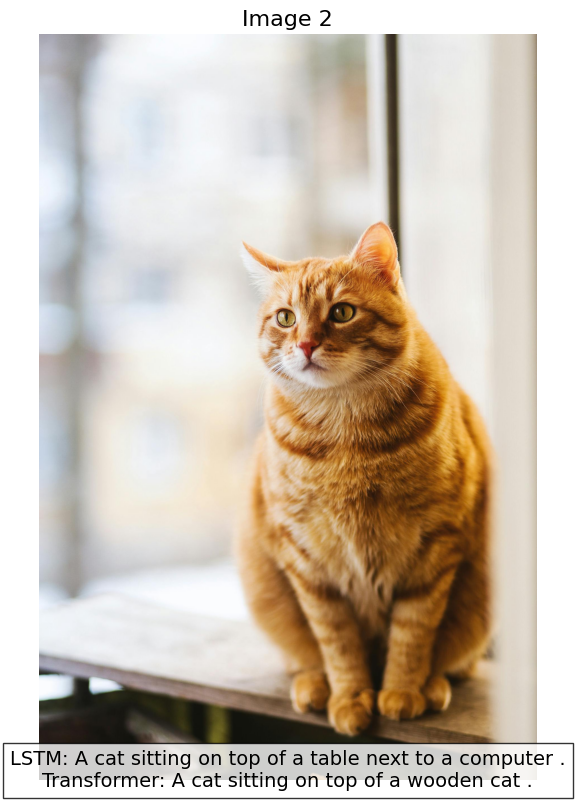

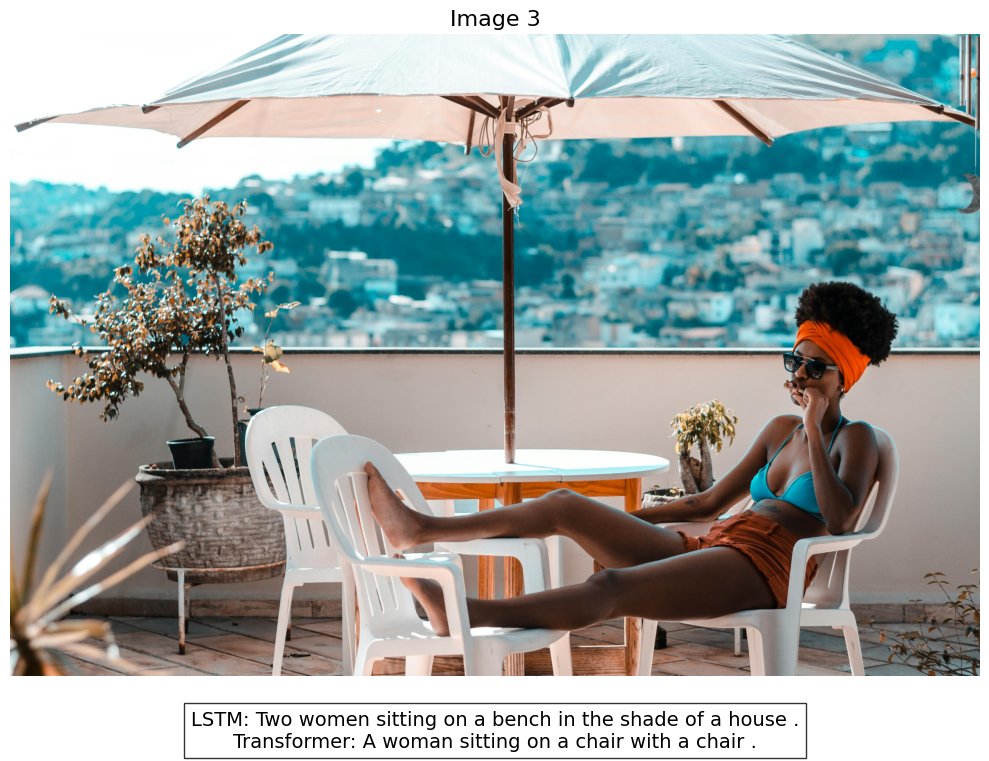

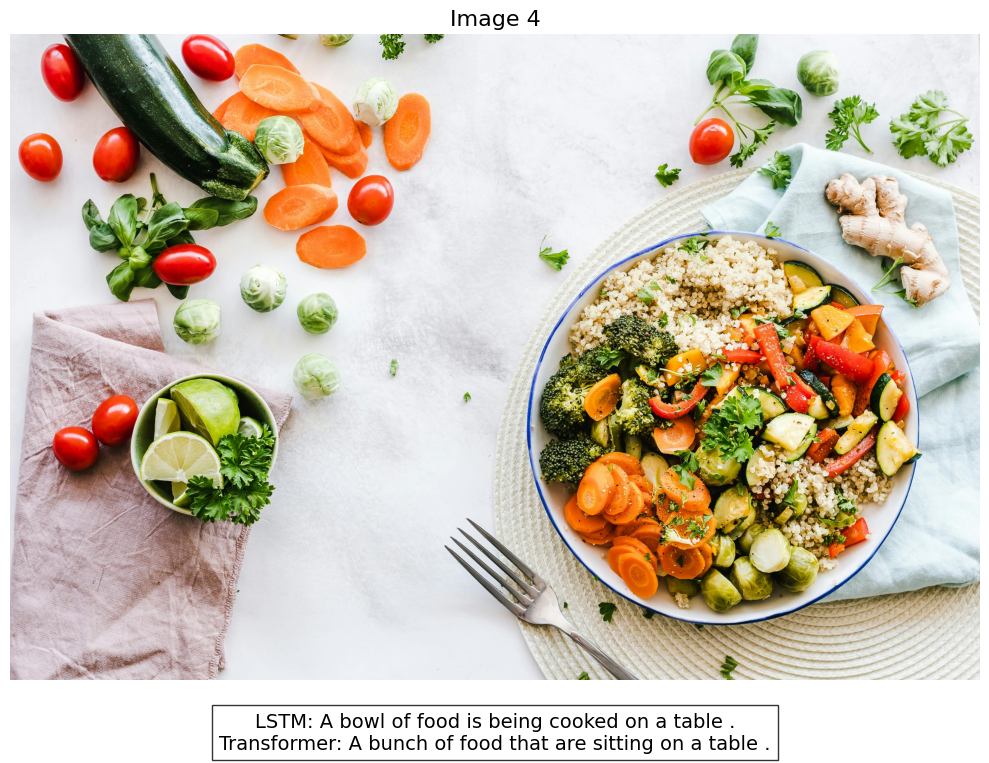

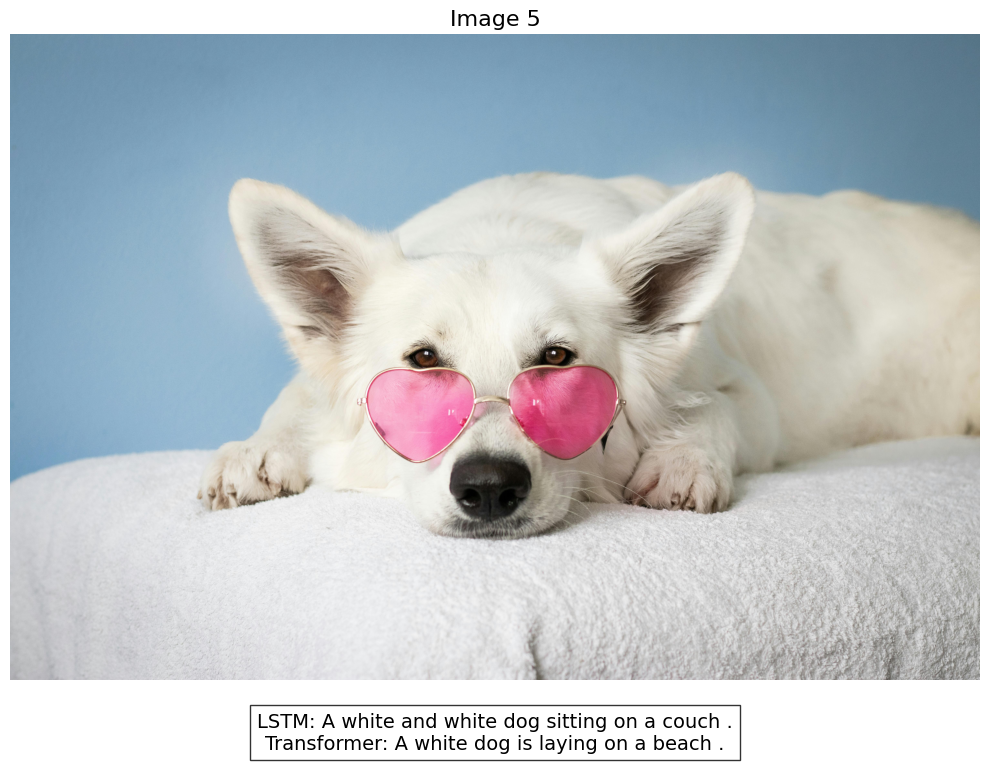

...

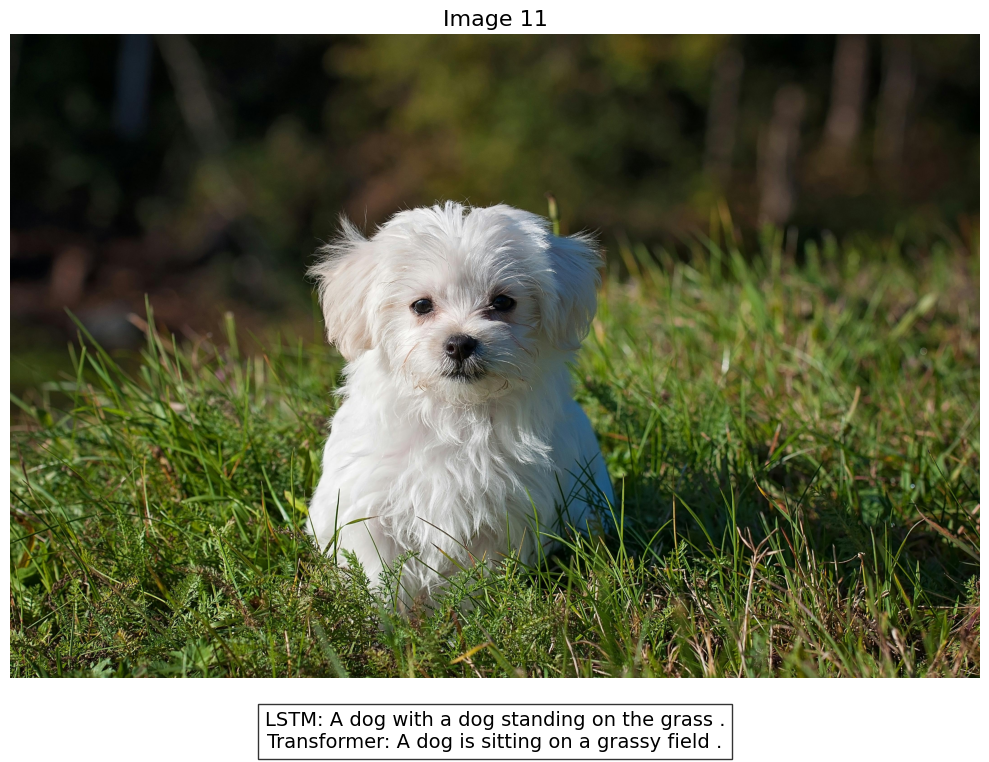

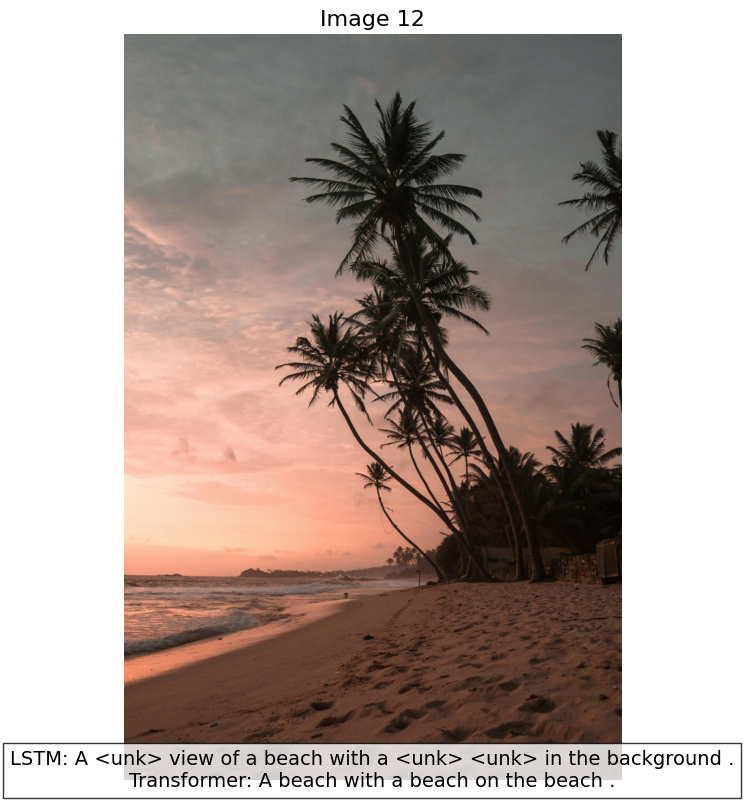

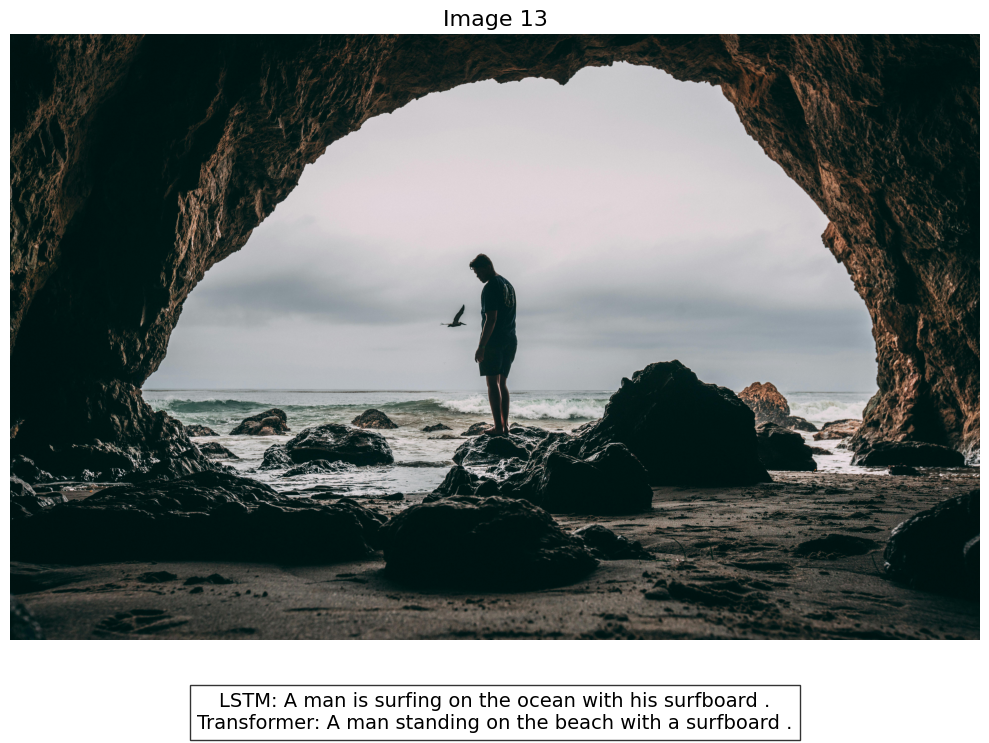

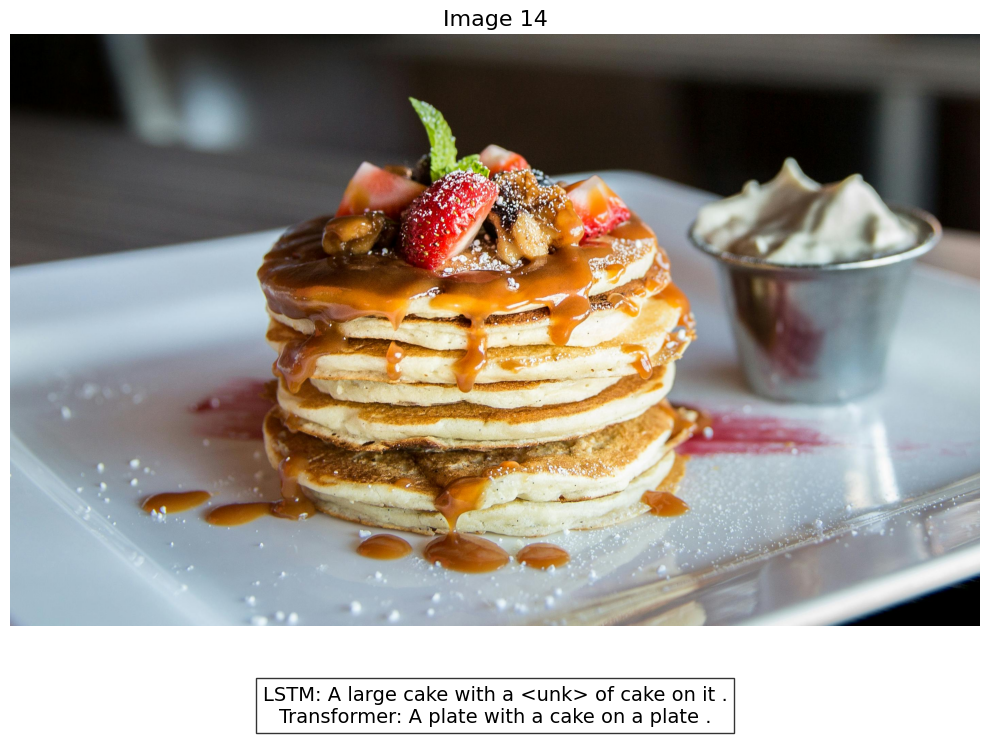

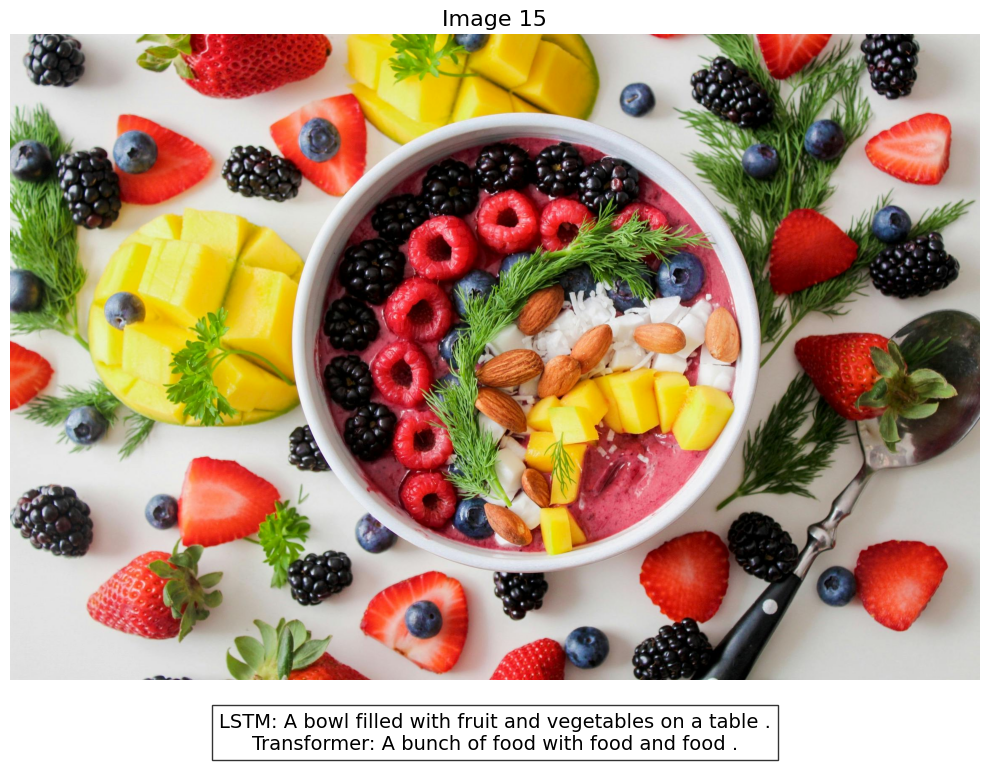


Evaluation complete! Results saved to {comparison_dir}


'Model comparison completed successfully!'

In [ ]:
evaluate_models_on_same_images()